# Use of Additional Modules
I used **Pandas** for efficient data manipulation and analysis, **Matplotlib** for basic plotting, and **Numpy** for numerical operations. **Seaborn** was chosen for its enhanced visualization capabilities, while **Folium** was employed to create interactive maps, with **MarkerCluster** facilitating the management of large sets of location data. These tools were selected to make the data analysis more insightful and visually appealing.

# Load the Data
This section involves loading the necessary libraries and datasets. We start by installing any required packages.

In [1]:
# Install Libraries 
!pip install pandas matplotlib seaborn numpy folium

In [2]:
# Import Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
from folium.plugins import MarkerCluster

In [3]:
# Load the datasets
temperature_df = pd.read_csv('/Users/pradulsmacbookair/Downloads/jupyter_env/Datasets/temperature (1).csv')
binsize_df = pd.read_csv('/Users/pradulsmacbookair/Downloads/jupyter_env/Datasets/BinSize (1).csv')

In [4]:
# Display the first few rows of dataset1 to understand the structure
print(temperature_df.head())

            ID        Date Element  Data_Value
0  USW00094889  2014-11-12    TMAX          22
1  USC00208972  2009-04-29    TMIN          56
2  USC00200032  2008-05-26    TMAX         278
3  USC00205563  2005-11-11    TMAX         139
4  USC00200230  2014-02-27    TMAX        -106


In [5]:
# Display the first few rows of dataset2 to understand the structure
print(binsize_df.head())

            ID  LATITUDE  LONGITUDE  ELEVATION STATE                 NAME  \
0  AE000041196    25.333     55.517       34.0   NaN  SHARJAH INTER. AIRP   
1  AEM00041194    25.255     55.364       10.4   NaN           DUBAI INTL   
2  AEM00041217    24.433     54.651       26.8   NaN       ABU DHABI INTL   
3  AEM00041218    24.262     55.609      264.9   NaN          AL AIN INTL   
4  AFM00040990    31.500     65.850     1010.0   NaN     KANDAHAR AIRPORT   

  GSNFLAG HCNFLAG    WMOID             x             y  \
0     GSN     NaN  41196.0  5.579578e+06  2.816905e+06   
1     NaN     NaN  41194.0  5.567782e+06  2.808232e+06   
2     NaN     NaN  41217.0  5.532707e+06  2.716829e+06   
3     NaN     NaN  41218.0  5.637301e+06  2.697815e+06   
4     NaN     NaN  40990.0  6.243199e+06  3.502645e+06   

                                  x_group  \
0  5497601.479782179 to 5594934.908498545   
1  5497601.479782179 to 5594934.908498545   
2  5497601.479782179 to 5594934.908498545   
3   5594

# Data Cleaning and Processing
Here, we clean and preprocess the data to ensure it is ready for analysis by filtering the temperature data for specific years and handling leap days.

In [6]:
# Convert date column to datetime format
temperature_df['date'] = pd.to_datetime(temperature_df['Date'])

In [7]:
# Display the first few rows to understand the structure
print(temperature_df.head())

            ID        Date Element  Data_Value       date
0  USW00094889  2014-11-12    TMAX          22 2014-11-12
1  USC00208972  2009-04-29    TMIN          56 2009-04-29
2  USC00200032  2008-05-26    TMAX         278 2008-05-26
3  USC00205563  2005-11-11    TMAX         139 2005-11-11
4  USC00200230  2014-02-27    TMAX        -106 2014-02-27


In [8]:
# Filter data for the years 2005-2014 and 2015
data_2005_2014 = temperature_df[(temperature_df['date'].dt.year >= 2005) & (temperature_df['date'].dt.year <= 2014)]
data_2015 = temperature_df[temperature_df['date'].dt.year == 2015]

In [9]:
# Display the first few rows to understand the structure
print(data_2005_2014.head())

            ID        Date Element  Data_Value       date
0  USW00094889  2014-11-12    TMAX          22 2014-11-12
1  USC00208972  2009-04-29    TMIN          56 2009-04-29
2  USC00200032  2008-05-26    TMAX         278 2008-05-26
3  USC00205563  2005-11-11    TMAX         139 2005-11-11
4  USC00200230  2014-02-27    TMAX        -106 2014-02-27


In [10]:
# Display the first few rows to understand the structure
print(data_2015.head())

             ID        Date Element  Data_Value       date
19  USC00205563  2015-01-03    TMIN         -39 2015-01-03
30  USC00203712  2015-03-17    TMAX         189 2015-03-17
34  USC00200032  2015-06-06    TMIN         128 2015-06-06
46  USW00014833  2015-08-30    TMIN         178 2015-08-30
50  USC00202308  2015-08-30    TMIN         156 2015-08-30


## 3. Watch out for leap days (i.e. February 29th), it is reasonable to remove these points from the dataset for the purpose of this visualization.

In [11]:
# Remove February 29th (leap day)
data_2005_2014 = data_2005_2014[~((data_2005_2014['date'].dt.month == 2) & (data_2005_2014['date'].dt.day == 29))]
data_2015 = data_2015[~((data_2015['date'].dt.month == 2) & (data_2015['date'].dt.day == 29))]

In [12]:
# Extract day of year for grouping
data_2005_2014['day_of_year'] = data_2005_2014['date'].dt.dayofyear
data_2015['day_of_year'] = data_2015['date'].dt.dayofyear

In [13]:
# Display the first few rows to understand the structure
print(data_2005_2014.head())

            ID        Date Element  Data_Value       date  day_of_year
0  USW00094889  2014-11-12    TMAX          22 2014-11-12          316
1  USC00208972  2009-04-29    TMIN          56 2009-04-29          119
2  USC00200032  2008-05-26    TMAX         278 2008-05-26          147
3  USC00205563  2005-11-11    TMAX         139 2005-11-11          315
4  USC00200230  2014-02-27    TMAX        -106 2014-02-27           58


In [14]:
# Display the first few rows to understand the structure
print(data_2015.head())

             ID        Date Element  Data_Value       date  day_of_year
19  USC00205563  2015-01-03    TMIN         -39 2015-01-03            3
30  USC00203712  2015-03-17    TMAX         189 2015-03-17           76
34  USC00200032  2015-06-06    TMIN         128 2015-06-06          157
46  USW00014833  2015-08-30    TMIN         178 2015-08-30          242
50  USC00202308  2015-08-30    TMIN         156 2015-08-30          242


# Calculate & Plot Record Highs and Lows
## 1. Familiarize yourself with the dataset, then write some python code which returns a line graph of the record high and record low temperatures by day of the year over the period 2005-2014. The area between the record high and record low temperatures for each day should be shaded.
## 4. Consider issues such as legends, labels, and chart junk. 
Here, we determine the record highs and lows for each day of the year from 2005 to 2014 using the `TMAX` and `TMIN` values from the `element` column and plot the record highs and lows with shaded area between the lines..

In [15]:
# Separate TMAX and TMIN data
tmax_2005_2014 = data_2005_2014[data_2005_2014['Element'] == 'TMAX']
tmin_2005_2014 = data_2005_2014[data_2005_2014['Element'] == 'TMIN']

In [16]:
# Calculate record highs and lows for each day of the year
record_highs = tmax_2005_2014.groupby('day_of_year')['Data_Value'].max()
record_lows = tmin_2005_2014.groupby('day_of_year')['Data_Value'].min()

In [17]:
# Convert to dataframe for easier plotting
records_df = pd.DataFrame({'record_high': record_highs, 'record_low': record_lows}).reset_index()

In [18]:
print(records_df.head())

   day_of_year  record_high  record_low
0            1          156        -160
1            2          139        -267
2            3          133        -267
3            4          106        -261
4            5          128        -150


In [19]:
# Plot the record highs and lows with shaded area between the lines.

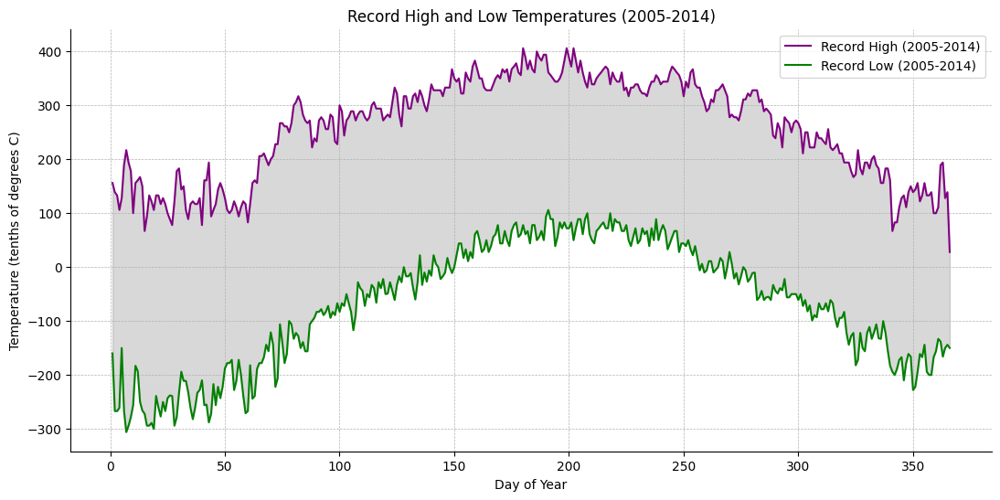

In [20]:
plt.figure(figsize=(13, 6))

# Plot record highs and lows
plt.plot(records_df['day_of_year'], records_df['record_high'], label='Record High (2005-2014)', color='Purple')
plt.plot(records_df['day_of_year'], records_df['record_low'], label='Record Low (2005-2014)', color='Green')

# Shade the area between high and low records
plt.fill_between(records_df['day_of_year'], records_df['record_high'], records_df['record_low'], color='gray', alpha=0.3)

# Labels and legends
plt.title('Record High and Low Temperatures (2005-2014)')
plt.xlabel('Day of Year')
plt.ylabel('Temperature (tenths of degrees C)')
# Legend positioning
plt.legend(loc='best')

# Remove unnecessary gridlines and background (minimal chart junk)
plt.grid(True, which='major', linestyle='--', linewidth=0.5)
plt.grid(False, which='minor')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.show()

# Overlay 2015 Data Points
## 2. Overlay a scatter of the 2015 data for any points (highs and lows) for which the ten year record (2005-2014) record high or record low was broken in 2015. 
## 4. Consider issues such as legends, labels, and chart junk. 
Here, we overlay a scatter plot of the 2015 data points where the ten-year records (2005-2014) for highs or lows were broken.

In [21]:
# Merge 2015 data with record data
merged_2015 = pd.merge(data_2015, records_df, on='day_of_year')

# Identify where 2015 broke records
record_breaking_highs = merged_2015[(merged_2015['Element'] == 'TMAX') & (merged_2015['Data_Value'] > merged_2015['record_high'])]
record_breaking_lows = merged_2015[(merged_2015['Element'] == 'TMIN') & (merged_2015['Data_Value'] < merged_2015['record_low'])]

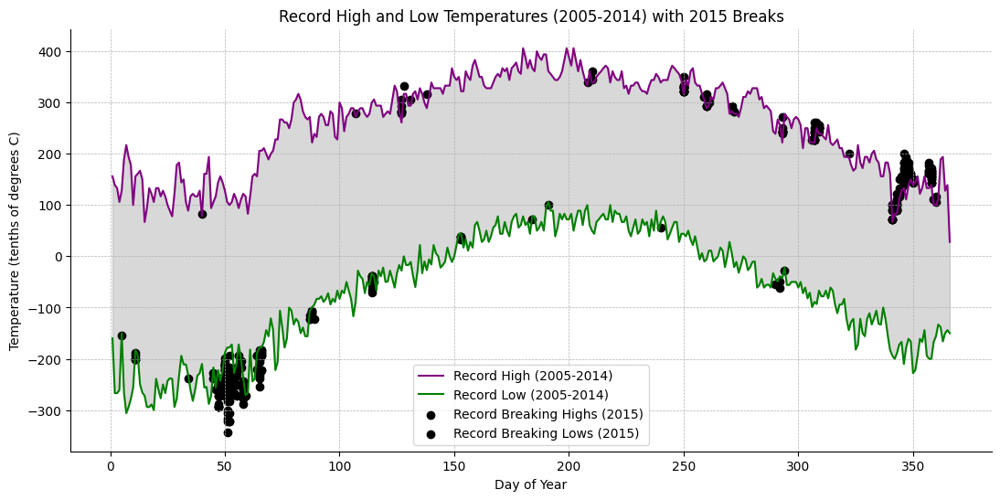

In [22]:
# Plot the record breaking points
plt.figure(figsize=(13, 6))

# Plot the existing records and shade
plt.plot(records_df['day_of_year'], records_df['record_high'], label='Record High (2005-2014)', color='Purple')
plt.plot(records_df['day_of_year'], records_df['record_low'], label='Record Low (2005-2014)', color='Green')
plt.fill_between(records_df['day_of_year'], records_df['record_high'], records_df['record_low'], color='grey', alpha=0.3)

# Overlay record breaking points
plt.scatter(record_breaking_highs['day_of_year'], record_breaking_highs['Data_Value'], color='black', label='Record Breaking Highs (2015)')
plt.scatter(record_breaking_lows['day_of_year'], record_breaking_lows['Data_Value'], color='black', label='Record Breaking Lows (2015)')

# Labels and legends
plt.title('Record High and Low Temperatures (2005-2014) with 2015 Breaks')
plt.xlabel('Day of Year')
plt.ylabel('Temperature (tenths of degrees C)')
# Legend positioning
plt.legend(loc='best')

# Remove unnecessary gridlines and background (minimal chart junk)
plt.grid(True, which='major', linestyle='--', linewidth=0.5)
plt.grid(False, which='minor')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

# Temperature Summary for 2015 
## 6. Plot Temperature Summary near Ann Arbor, Michigan, United States (Year 2015).
## 4. Consider issues such as legends, labels, and chart junk. 
Here, we plot the temperature summary for the year 2015 near Ann Arbor, Michigan, United States.

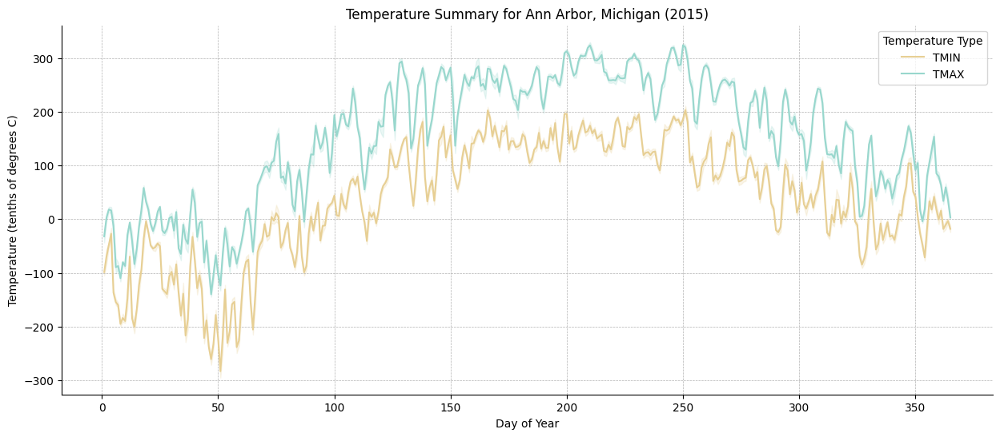

In [23]:
# Use the 2015 data for Ann Arbor;
ann_arbor_2015 = data_2015

plt.figure(figsize=(15, 6))
sns.lineplot(data=ann_arbor_2015, x='day_of_year', y='Data_Value', hue='Element', palette='BrBG')
plt.title('Temperature Summary for Ann Arbor, Michigan (2015)')
plt.xlabel('Day of Year')
plt.ylabel('Temperature (tenths of degrees C)')
plt.legend(title='Temperature Type',loc='best')

# Remove unnecessary gridlines and background (minimal chart junk)
plt.grid(True, which='major', linestyle='--', linewidth=0.5)
plt.grid(False, which='minor')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.show()

# Map Visualization
## 5. The data you have been given is near **Ann Arbor, Michigan, United States**, and visualize on map the stations the data.
Here, we visualize the stations on a map using the data provided from near Ann Arbor, Michigan, United States.

In [24]:
# Extract station locations with latitude and longitude
station_locations = binsize_df[['ID', 'LATITUDE', 'LONGITUDE']]

# Create a folium map centered on Ann Arbor
ann_arbor_coords = [42.2947, -83.7108]
m = folium.Map(location=ann_arbor_coords, zoom_start=10)

# Add stations to the map using MarkerCluster
marker_cluster = MarkerCluster().add_to(m)
for _, row in station_locations.iterrows():
    folium.Marker(location=[row['LATITUDE'], row['LONGITUDE']], 
                  popup=f"Station ID: {row['ID']}").add_to(marker_cluster)

# Display the map
m

In [25]:
# Save the map as an HTML file
m.save('station_map.html')